# Exoplanet exploration using Machine Learning

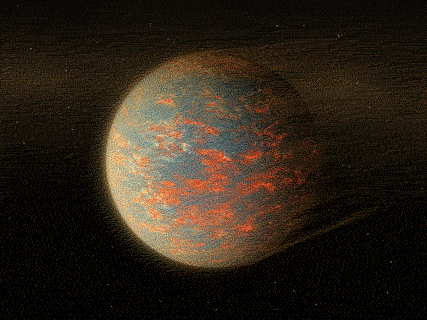

## What are exoplanets?

Exoplanets are planets beyond our own solar system. Thousands have been discovered in the past two decades, mostly with NASA’s Kepler Space Telescope.

These exoplanets come in a huge variety of sizes and orbits. Some are gigantic planets hugging close to their parent stars; others are icy, some rocky. NASA and other agencies are looking for a special kind of planet: one that’s the same size as Earth, orbiting a sun-like star in the habitable zone.


The habitable zone is the area around a star where it is not too hot and not too cold for liquid water to exist on the surface of surrounding planets. Imagine if Earth was where Pluto is. The Sun would be barely visible (about the size of a pea) and Earth’s ocean and much of its atmosphere would freeze.

You can also check out my article to understand more about exoplanets at [www.theaidream.com](https://www.theaidream.com/post/exoplanet-exploration-using-machine-learning)

In [1]:
import os
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
        if  filename.endswith('.csv'):
            print(os.path.join(dirname, filename))

./exoTrain.csv
./exoTest.csv
./.ipynb_checkpoints/exoTest-checkpoint.csv


### Load all the required libraries

In [2]:
import os
import warnings
import math
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
from sklearn.metrics import mean_squared_error, mean_absolute_error
from imblearn.over_sampling import SMOTE, RandomOverSampler
from sklearn.model_selection import train_test_split 
from sklearn import linear_model
from sklearn.metrics import recall_score, precision_score, classification_report,accuracy_score, confusion_matrix, roc_curve, auc, roc_curve,accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler, normalize
from scipy import ndimage
import seaborn as sns

### Load the train and test data.

In [3]:
test_data = pd.read_csv('exoTest.csv')
train_data = pd.read_csv('exoTrain.csv')

In [4]:
train_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,2,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,2,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,2,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,2,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,2,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,1,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,...,139.95,147.26,156.95,155.64,156.36,151.75,-24.45,-17.00,3.23,19.28
5083,1,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,...,-26.50,-4.84,-76.30,-37.84,-153.83,-136.16,38.03,100.28,-45.64,35.58
5084,1,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,...,-26.82,-53.89,-48.71,30.99,15.96,-3.47,65.73,88.42,79.07,79.43
5085,1,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,...,10.86,-3.23,-5.10,-4.61,-9.82,-1.50,-4.65,-14.55,-6.41,-2.55


Now the target column LABEL consists of two categories 1(Does not represents exoplanet) and 2(represents the presence of exoplanet). So, convert them to binary values for easier processing of data.

In [5]:
categ = {2: 1,1: 0}
train_data.LABEL = [categ[item] for item in train_data.LABEL]
test_data.LABEL = [categ[item] for item in test_data.LABEL]

In [6]:
train_data.describe()

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
count,5087.000000,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,...,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5087.000000,5087.000000,5087.000000,5087.000000
mean,0.007273,1.445054e+02,1.285778e+02,1.471348e+02,1.561512e+02,1.561477e+02,1.469646e+02,1.168380e+02,1.144983e+02,1.228639e+02,...,3.485578e+02,4.956476e+02,6.711211e+02,7.468790e+02,6.937372e+02,6.553031e+02,-494.784966,-544.594264,-440.239100,-300.536399
std,0.084982,2.150669e+04,2.179717e+04,2.191309e+04,2.223366e+04,2.308448e+04,2.410567e+04,2.414109e+04,2.290691e+04,2.102681e+04,...,2.864786e+04,3.551876e+04,4.349963e+04,4.981375e+04,5.087103e+04,5.339979e+04,17844.469520,17722.339334,16273.406292,14459.795577
min,0.000000,-2.278563e+05,-3.154408e+05,-2.840018e+05,-2.340069e+05,-4.231956e+05,-5.975521e+05,-6.724046e+05,-5.790136e+05,-3.973882e+05,...,-3.240480e+05,-3.045540e+05,-2.933140e+05,-2.838420e+05,-3.288214e+05,-5.028894e+05,-775322.000000,-732006.000000,-700992.000000,-643170.000000
25%,0.000000,-4.234000e+01,-3.952000e+01,-3.850500e+01,-3.505000e+01,-3.195500e+01,-3.338000e+01,-2.813000e+01,-2.784000e+01,-2.683500e+01,...,-1.760000e+01,-1.948500e+01,-1.757000e+01,-2.076000e+01,-2.226000e+01,-2.440500e+01,-26.760000,-24.065000,-21.135000,-19.820000
50%,0.000000,-7.100000e-01,-8.900000e-01,-7.400000e-01,-4.000000e-01,-6.100000e-01,-1.030000e+00,-8.700000e-01,-6.600000e-01,-5.600000e-01,...,2.600000e+00,2.680000e+00,3.050000e+00,3.590000e+00,3.230000e+00,3.500000e+00,-0.680000,0.360000,0.900000,1.430000
75%,0.000000,4.825500e+01,4.428500e+01,4.232500e+01,3.976500e+01,3.975000e+01,3.514000e+01,3.406000e+01,3.170000e+01,3.045500e+01,...,2.211000e+01,2.235000e+01,2.639500e+01,2.909000e+01,2.780000e+01,3.085500e+01,18.175000,18.770000,19.465000,20.280000
max,1.000000,1.439240e+06,1.453319e+06,1.468429e+06,1.495750e+06,1.510937e+06,1.508152e+06,1.465743e+06,1.416827e+06,1.342888e+06,...,1.779338e+06,2.379227e+06,2.992070e+06,3.434973e+06,3.481220e+06,3.616292e+06,288607.500000,215972.000000,207590.000000,211302.000000


Now visualize the target column in the train_dataset and get an idea about the class distribution.

In [7]:
train_data['LABEL'].value_counts()

LABEL
0    5050
1      37
Name: count, dtype: int64

We have 5050 records of non-exoplanets and 37 records of exoplanets.

In [8]:
train_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,1,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,1,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,1,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,1,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,1,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,0,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,...,139.95,147.26,156.95,155.64,156.36,151.75,-24.45,-17.00,3.23,19.28
5083,0,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,...,-26.50,-4.84,-76.30,-37.84,-153.83,-136.16,38.03,100.28,-45.64,35.58
5084,0,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,...,-26.82,-53.89,-48.71,30.99,15.96,-3.47,65.73,88.42,79.07,79.43
5085,0,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,...,10.86,-3.23,-5.10,-4.61,-9.82,-1.50,-4.65,-14.55,-6.41,-2.55


Text(0.5, 1.0, 'Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)')

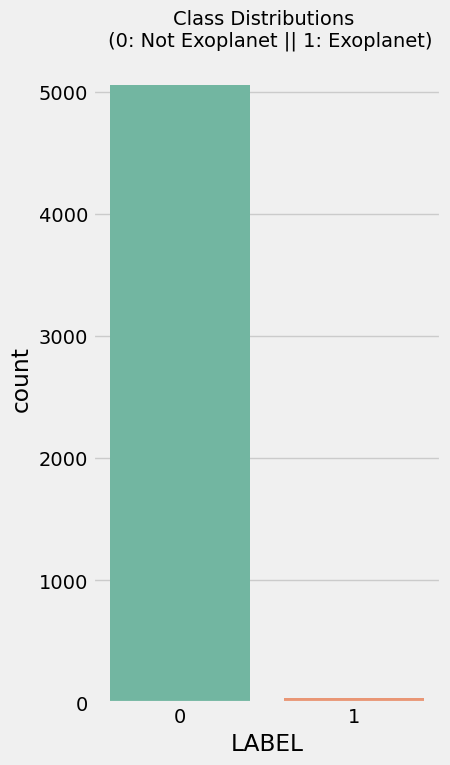

In [9]:
plt.figure(figsize=(4,8))
colors = ["0", "1"]
sns.countplot(x='LABEL', data=train_data, palette = "Set2")
plt.title('Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)', fontsize=14)

It turns out that the data is highly imbalanced so later on we'll be using some sampling techniques to balance the data.

### Plotting heatmap of missing values

<Axes: >

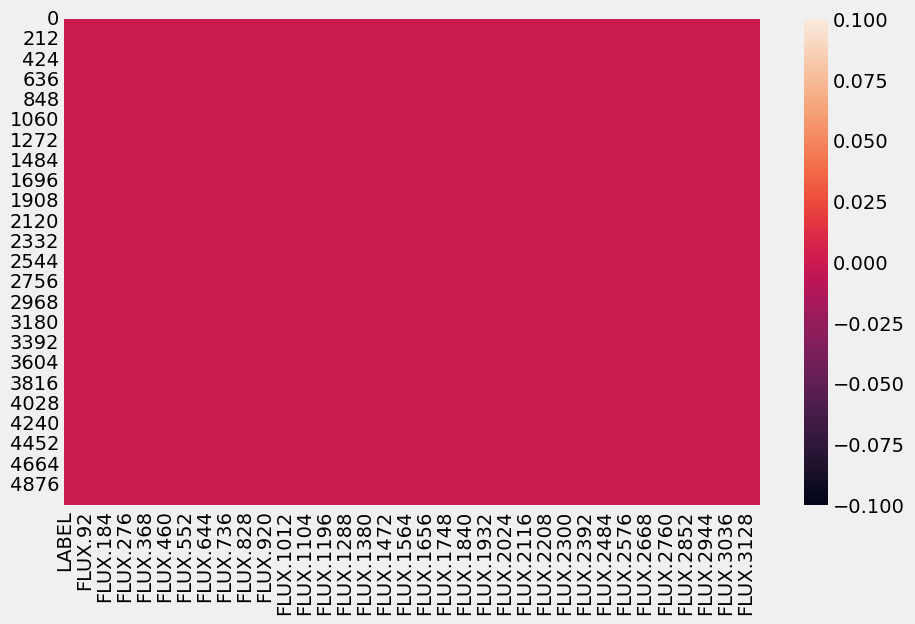

In [10]:
sns.heatmap(train_data.isnull())

We can clearly see that we dont have any missing values in our dataset.

**Flux :** the intensity of light recived from a planet

### Let us plot the first 4 rows of the train data and observe the intensity of flux values.

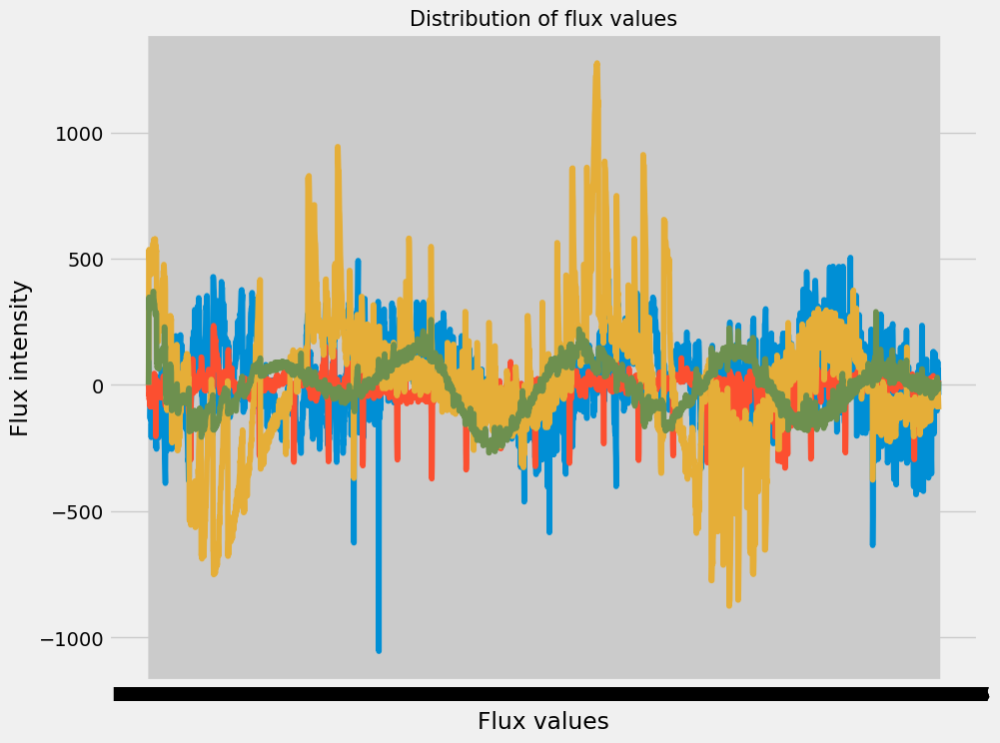

In [11]:
plt.figure(figsize=(10,8))
plt.title('Distribution of flux values', fontsize=15)
plt.xlabel('Flux values')
plt.ylabel('Flux intensity')
plt.plot(train_data.iloc[0,])
plt.plot(train_data.iloc[1,])
plt.plot(train_data.iloc[2,])
plt.plot(train_data.iloc[3,])
plt.show()

### Plotting the correlation matrix

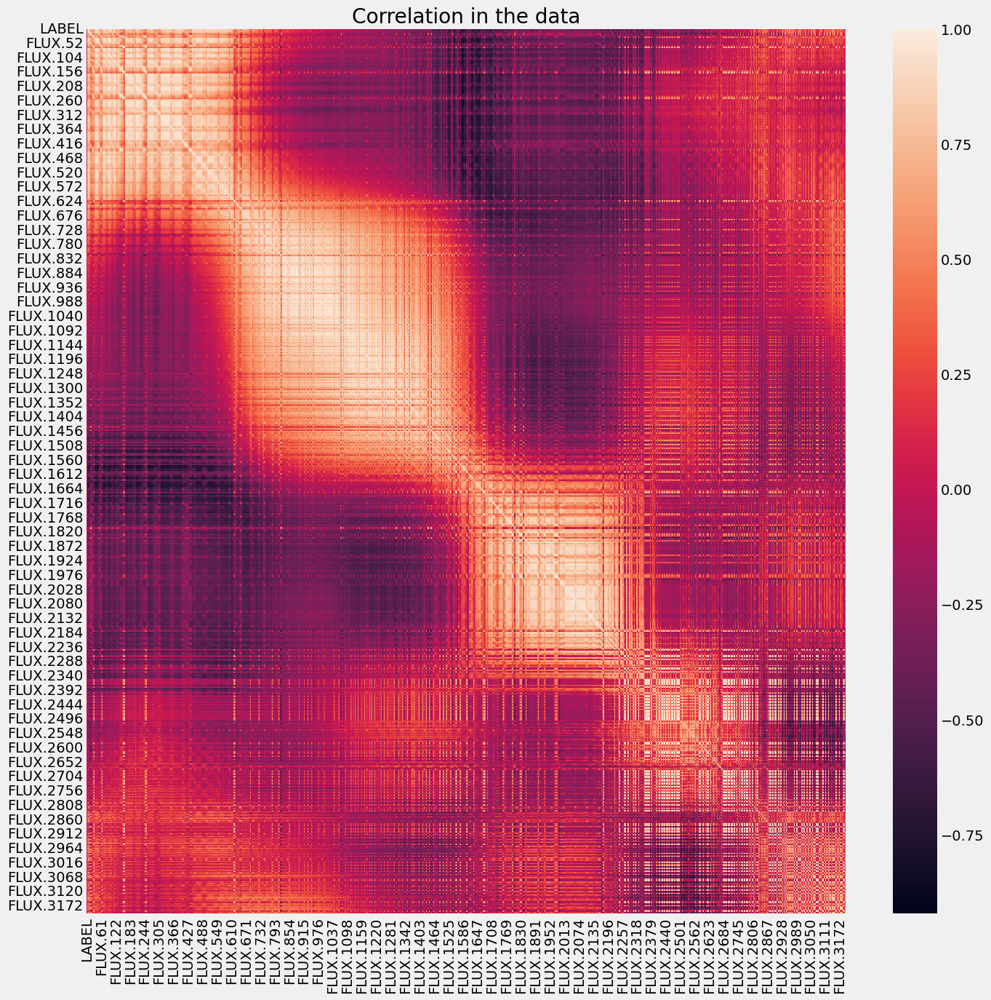

In [12]:
plt.figure(figsize=(15,15))
sns.heatmap(train_data.corr())
plt.title('Correlation in the data')
plt.show()

### plot the Gaussian histogram of non-exoplanets data.

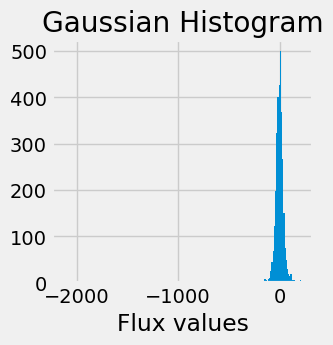

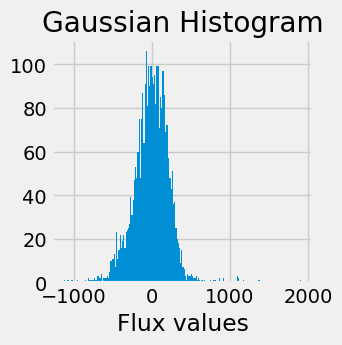

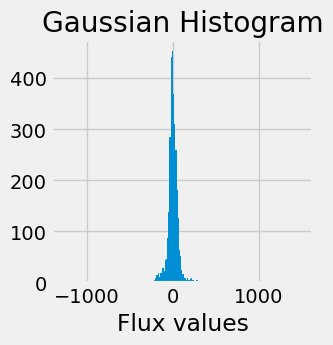

In [13]:
labels_1=[100,200,300]
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram")
    plt.xlabel("Flux values")
    plt.show()

### plot Gaussian histogram of the data when exoplanets are present.

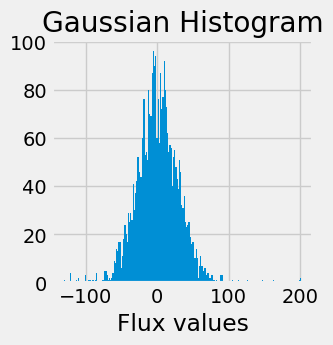

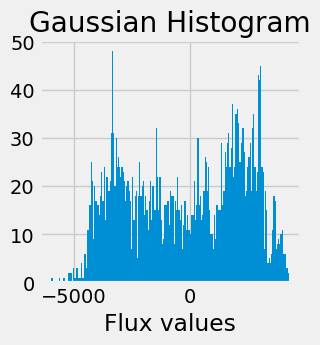

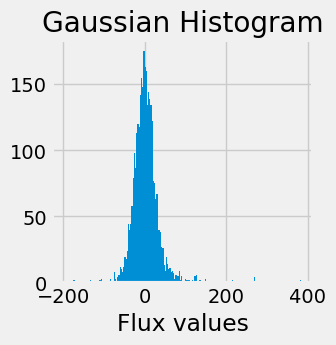

In [14]:
labels_1=[16,21,25]
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram")
    plt.xlabel("Flux values")
    plt.show()

### Detecting outliers using Boxplot

Box Plot is the visual representation of the depicting groups of numerical data through their quartiles. Boxplot is also used for detect the outlier in data set. It captures the summary of the data efficiently with a simple box and whiskers and allows us to compare easily across groups. Boxplot summarizes a sample data using 25th, 50th and 75th percentiles. 

<Axes: xlabel='LABEL', ylabel='FLUX.5'>

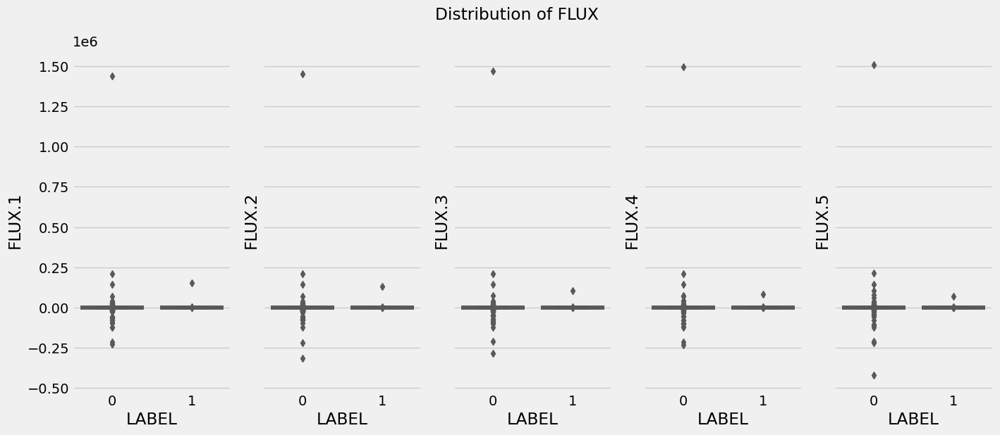

In [15]:
fig, axes = plt.subplots(1, 5,figsize=(15, 6), sharey=True)
fig.suptitle('Distribution of FLUX')

sns.boxplot(ax=axes[0], data=train_data, x='LABEL', y='FLUX.1',palette="Set2")
sns.boxplot(ax=axes[1], data=train_data, x='LABEL', y='FLUX.2',palette="Set2")
sns.boxplot(ax=axes[2], data=train_data, x='LABEL', y='FLUX.3',palette="Set2")
sns.boxplot(ax=axes[3], data=train_data, x='LABEL', y='FLUX.4',palette="Set2")
sns.boxplot(ax=axes[4], data=train_data, x='LABEL', y='FLUX.5',palette="Set2")


In [16]:
print('Dropping Outliers')
train_data.drop(train_data[train_data['FLUX.1']>250000].index, axis=0, inplace=True)

Dropping Outliers


### Split the dataset

So let us first split our dataset and normalize it.

In [17]:
x_train = train_data.drop(["LABEL"],axis=1)
y_train = train_data["LABEL"]   
x_test = test_data.drop(["LABEL"],axis=1)
y_test = test_data["LABEL"]

### Data Normalization

**Data Normalization** is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric columns in the dataset to a common scale, without distorting differences in the ranges of values.

In [18]:
x_train = normalized = normalize(x_train)
x_test = normalize(x_test)

### Apply gaussian filters

The next step is to apply gaussian filters to both test and train.


In probability theory, the normal (or Gaussian or Gauss or Laplace–Gauss) distribution is a very common continuous probability distribution. Normal distributions are important in statistics and are often used in the natural and social sciences to represent real-valued random variables whose distributions are not known.

In [19]:
x_train = filtered = ndimage.filters.gaussian_filter(x_train, sigma=10)
x_test = ndimage.filters.gaussian_filter(x_test, sigma=10)

### Feature scaling

we use feature scaling so that all the values remain in the comparable range.

In [20]:
#Feature scaling
std_scaler = StandardScaler()
x_train = scaled = std_scaler.fit_transform(x_train)
x_test = std_scaler.fit_transform(x_test)

In [21]:
x_test

array([[ 3.51578425,  3.51335888,  3.50848839, ..., -1.47777011,
        -1.4781795 , -1.47838018],
       [ 3.49827611,  3.49596338,  3.49131728, ..., -1.48289201,
        -1.48329969, -1.48349865],
       [ 3.46332508,  3.46123606,  3.45703556, ..., -1.49267222,
        -1.49307723, -1.49327315],
       ...,
       [-0.50387399, -0.50686332, -0.51282952, ..., -0.80862908,
        -0.82260759, -0.82965553],
       [-0.48298394, -0.48604744, -0.49216449, ..., -0.81814362,
        -0.83221736, -0.83931256],
       [-0.47238022, -0.4754811 , -0.48167418, ..., -0.82287431,
        -0.83699554, -0.84411431]])

### Model Building

Validation accuracy of KNN is 0.9912280701754386

Classification report :
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.00      0.00      0.00         5

    accuracy                           0.99       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.99      0.99       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

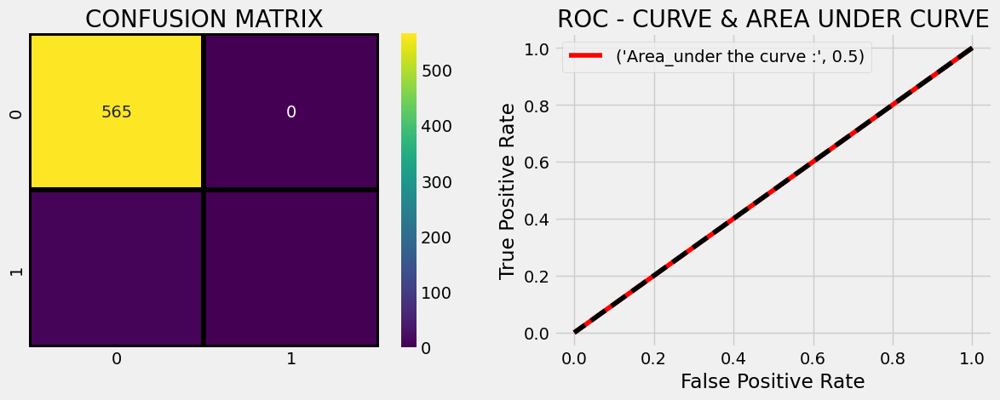

In [22]:
#K-NN
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier()

knn_model.fit(x_train, y_train)
prediction=knn_model.predict(x_test)
print('Validation accuracy of KNN is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = knn_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

In [23]:
y_test

0      1
1      1
2      1
3      1
4      1
      ..
565    0
566    0
567    0
568    0
569    0
Name: LABEL, Length: 570, dtype: int64

Validation accuracy of Logistic Regression is 0.9912280701754386

Classification report :
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.00      0.00      0.00         5

    accuracy                           0.99       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.99      0.99       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

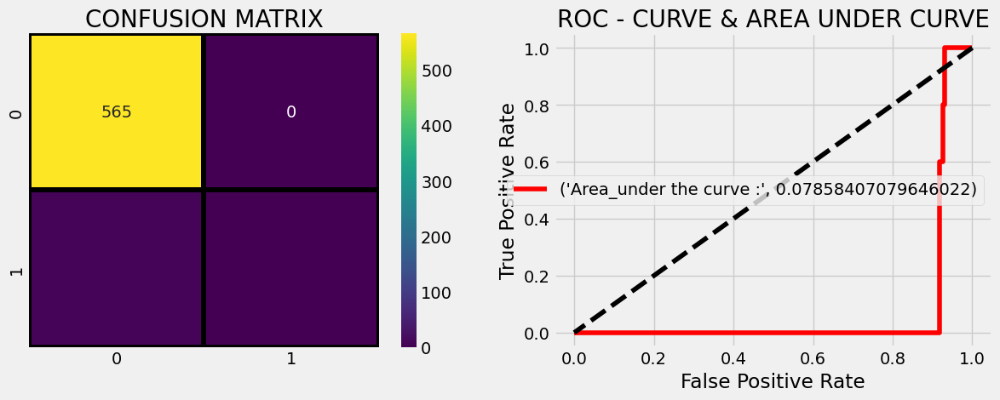

In [24]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
lr_model = LogisticRegression(class_weight={0:100, 1:1})

lr_model.fit(x_train,y_train)

prediction=lr_model.predict(x_test)

print('Validation accuracy of Logistic Regression is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = lr_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test, predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Validation accuracy of Decision Tree is 0.9614035087719298

Classification report :
               precision    recall  f1-score   support

           0       0.99      0.97      0.98       565
           1       0.00      0.00      0.00         5

    accuracy                           0.96       570
   macro avg       0.50      0.48      0.49       570
weighted avg       0.98      0.96      0.97       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

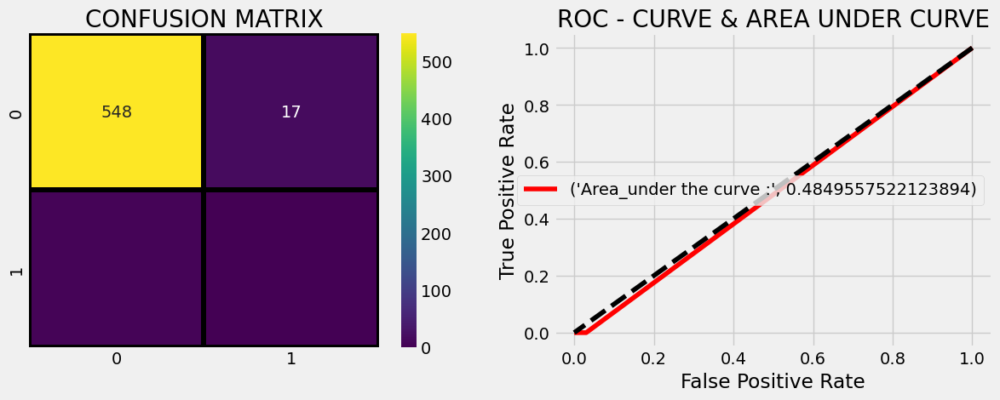

In [25]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
ds_model = DecisionTreeClassifier(max_depth=5, random_state=13)

ds_model.fit(x_train,y_train)

prediction=ds_model.predict(x_test)

print('Validation accuracy of Decision Tree is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = ds_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Since the dataset is highly imbalanced even if the model predicts the same class for all data points the accuracy.

So let us first balance the classes and model it again.

### Balancing the class using SMOTE

**SMOTE** **(synthetic minority oversampling technique)** is one of the most commonly used oversampling methods to solve the imbalance problem. It aims to balance class distribution by randomly increasing minority class examples by replicating them. **SMOTE** synthesises new minority instances between existing minority instances.

<Axes: xlabel='LABEL'>

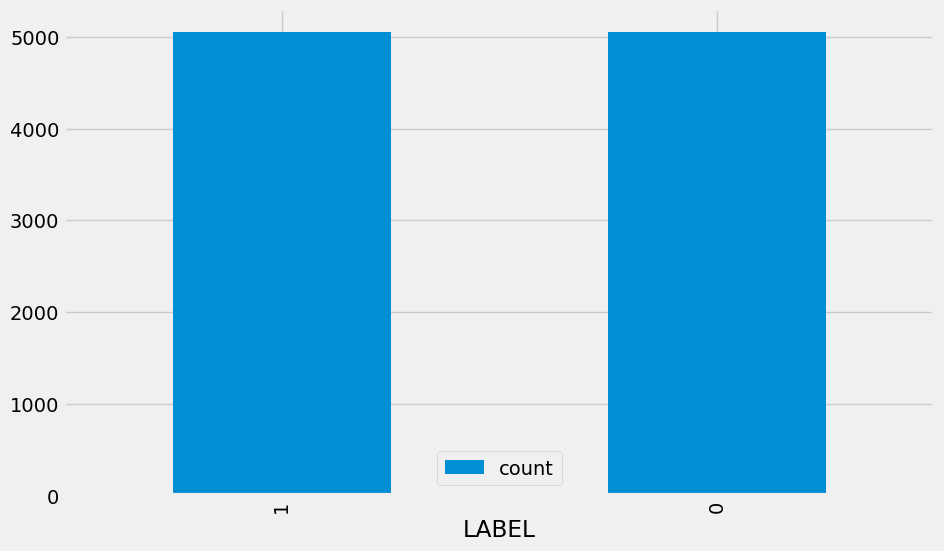

In [26]:
from imblearn.over_sampling import SMOTE
model = SMOTE()
ov_train_x,ov_train_y = model.fit_resample(train_data.drop('LABEL', axis=1), train_data['LABEL'])
ov_train_y = ov_train_y.astype('int')

ov_train_y.value_counts().reset_index().plot(kind='bar', y='count', x='LABEL')

### Split the dataset

In [27]:
train_X, test_X, train_y, test_y = train_test_split(ov_train_x, ov_train_y, test_size=0.33, random_state=42)

Validation accuracy of Decision Tree is 0.9135913591359136

Classification report :
               precision    recall  f1-score   support

           0       0.98      0.85      0.91      1709
           1       0.86      0.98      0.92      1624

    accuracy                           0.91      3333
   macro avg       0.92      0.92      0.91      3333
weighted avg       0.92      0.91      0.91      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

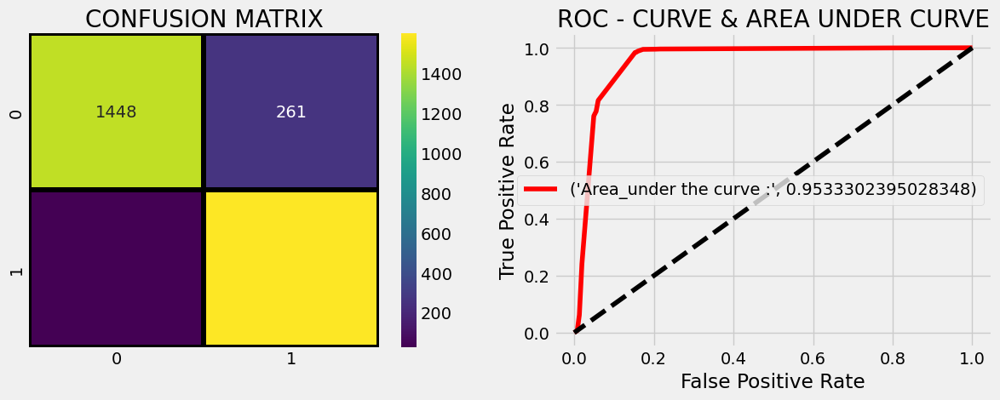

In [28]:
from sklearn.tree import DecisionTreeClassifier
ds_model = DecisionTreeClassifier(max_depth=5, random_state=13)

ds_model.fit(train_X,train_y)

prediction=ds_model.predict(test_X)

print('Validation accuracy of Decision Tree is', accuracy_score(prediction,test_y))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = ds_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Validation accuracy of KNN is 0.9828982898289829

Classification report :
               precision    recall  f1-score   support

           0       1.00      0.97      0.98      1709
           1       0.97      1.00      0.98      1624

    accuracy                           0.98      3333
   macro avg       0.98      0.98      0.98      3333
weighted avg       0.98      0.98      0.98      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

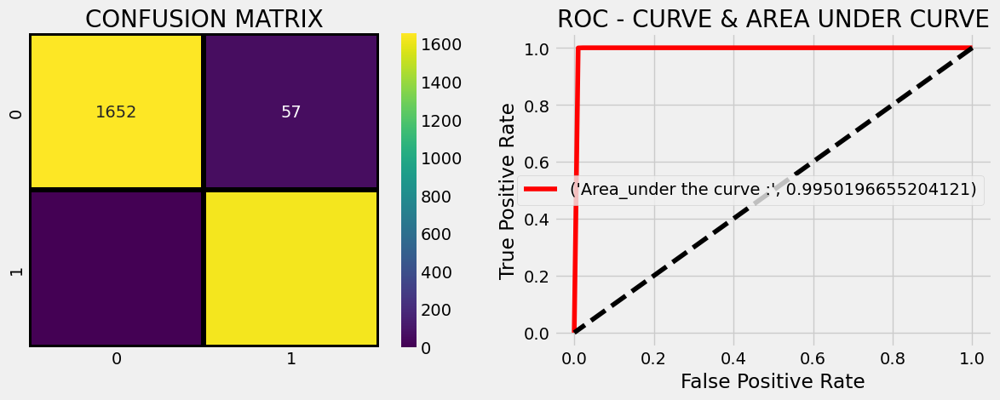

In [29]:
knn_model = KNeighborsClassifier()

knn_model.fit(train_X,train_y)

prediction=knn_model.predict(test_X)

print('Validation accuracy of KNN is', accuracy_score(prediction,test_y))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = knn_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Validation accuracy of Logistic Regression is 0.7602760276027603

Classification report :
               precision    recall  f1-score   support

           0       0.81      0.69      0.75      1709
           1       0.72      0.83      0.77      1624

    accuracy                           0.76      3333
   macro avg       0.77      0.76      0.76      3333
weighted avg       0.77      0.76      0.76      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

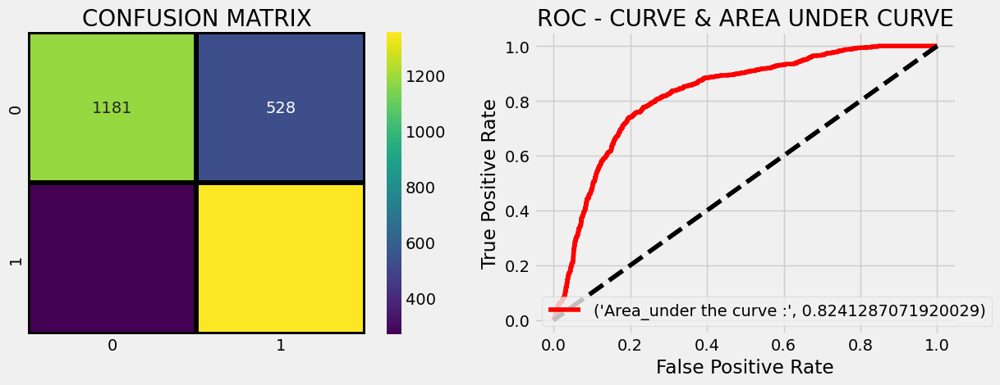

In [30]:
lr_model = LogisticRegression(class_weight={0:100, 1:1})

lr_model.fit(train_X,train_y)

prediction=lr_model.predict(test_X)

print('Validation accuracy of Logistic Regression is', accuracy_score(prediction,test_y))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = lr_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

As we can observe after applying SMOTE to balance the classes, our ML models are performing really good.

### Additions

In [31]:
# Let's use the KNN classifier on previous exoplanet data

exo_df = pd.read_csv('../t2_naivebayes/PS_2024.05.02_07.53.02.csv', skiprows=range(60)) # skipping the first 60 metadata rows.
exo_df = exo_df.drop('st_metratio', axis='columns') # getting rid of this column as it is non-numeric
na_counts = exo_df.isna().sum()
exo_df

,default_flag,sy_snum,sy_pnum,sy_mnum,cb_flag,discoverymethod,rv_flag,pul_flag,ptv_flag,tran_flag,...,st_dens,st_vsin,st_rotp,st_radv,sy_pm,sy_dist,sy_plx,sy_vmag,sy_kmag,sy_gaiamag
0,0,2,1,0,0,Radial Velocity,1,0,0,0,...,NaN,NaN,NaN,NaN,140.383627,93.1846,10.71040,4.72307,2.282,4.44038
1,0,2,1,0,0,Radial Velocity,1,0,0,0,...,NaN,1.20,NaN,NaN,140.383627,93.1846,10.71040,4.72307,2.282,4.44038
2,1,2,1,0,0,Radial Velocity,1,0,0,0,...,NaN,NaN,NaN,NaN,140.383627,93.1846,10.71040,4.72307,2.282,4.44038
3,1,1,1,0,0,Radial Velocity,1,0,0,0,...,NaN,NaN,NaN,NaN,10.679019,125.3210,7.95388,5.01300,1.939,4.56216
4,0,1,1,0,0,Radial Velocity,1,0,0,0,...,NaN,NaN,NaN,NaN,10.679019,125.3210,7.95388,5.01300,1.939,4.56216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35916,0,2,3,0,0,Radial Velocity,1,0,0,0,...,NaN,NaN,NaN,-28.66,419.857418,13.4054,74.57110,4.09565,2.859,3.98687
35917,1,1,1,0,0,Radial Velocity,1,0,0,0,...,NaN,1.78,NaN,NaN,42.335113,52.5973,18.99390,4.30490,2.184,4.03040
35918,0,1,1,0,0,Radial Velocity,1,0,0,0,...,NaN,NaN,NaN,NaN,129.341395,56.1858,17.77250,4.70964,2.171,4.42501
35919,0,1,1,0,0,Radial Velocity,1,0,0,0,...,NaN,NaN,NaN,NaN,129.341395,56.1858,17.77250,4.70964,2.171,4.42501


In [32]:
def add_method(row):
    if row['discoverymethod'] == 'Transit':
        return 1
    return 0

def add_discovery(row):
    if row['method'] == 1:
        return 'Transit'
    return 'non-Transit'

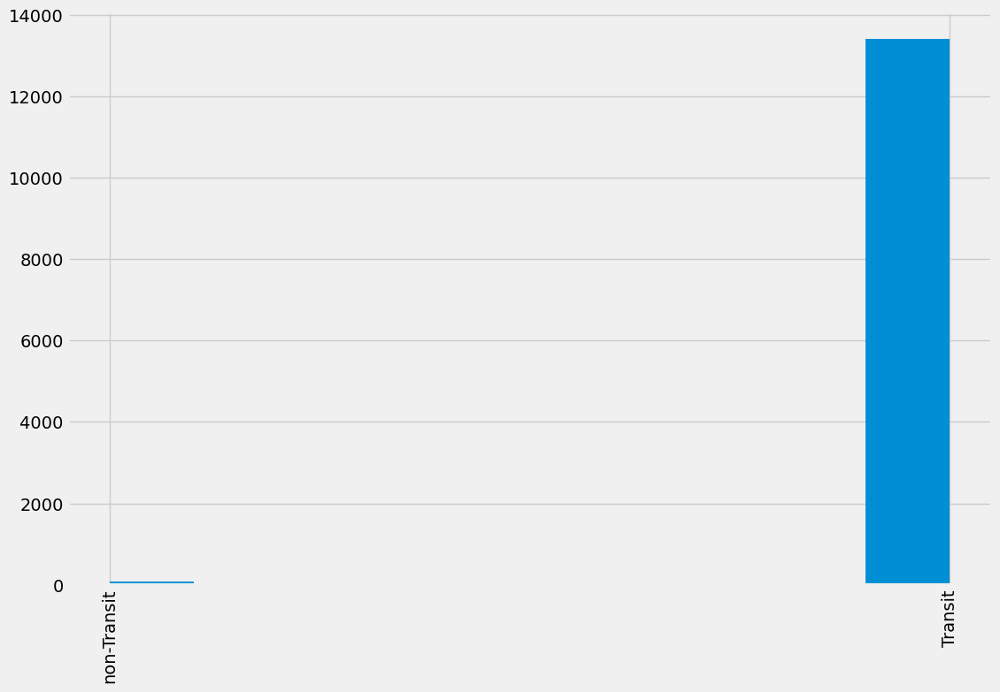

In [33]:
exo_df_filt = exo_df[na_counts[na_counts < 15000].index]
exo_df_filt = exo_df_filt.dropna()

exo_df_filt['method'] = exo_df_filt.apply(add_method, axis=1)
exo_df_filt['method_str'] = exo_df_filt.apply(add_discovery, axis=1)

plt.figure(figsize=(12,8))

plt.hist(exo_df_filt['method_str'])

plt.xticks(rotation=90)
plt.show()

Cutoff:	30000

method_str
Transit        64
non-Transit     6
Name: count, dtype: int64 

Validation accuracy of KNN is 0.9142857142857143

Classification report :
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.91      1.00      0.96        32

    accuracy                           0.91        35
   macro avg       0.46      0.50      0.48        35
weighted avg       0.84      0.91      0.87        35





Cutoff:	25000

method_str
Transit        10199
non-Transit       54
Name: count, dtype: int64 

Validation accuracy of KNN is 0.9931733957480008

Classification report :
               precision    recall  f1-score   support

           0       0.35      0.20      0.26        30
           1       1.00      1.00      1.00      5097

    accuracy                           0.99      5127
   macro avg       0.67      0.60      0.63      5127
weighted avg       0.99      0.99      0.99      5127





Cu

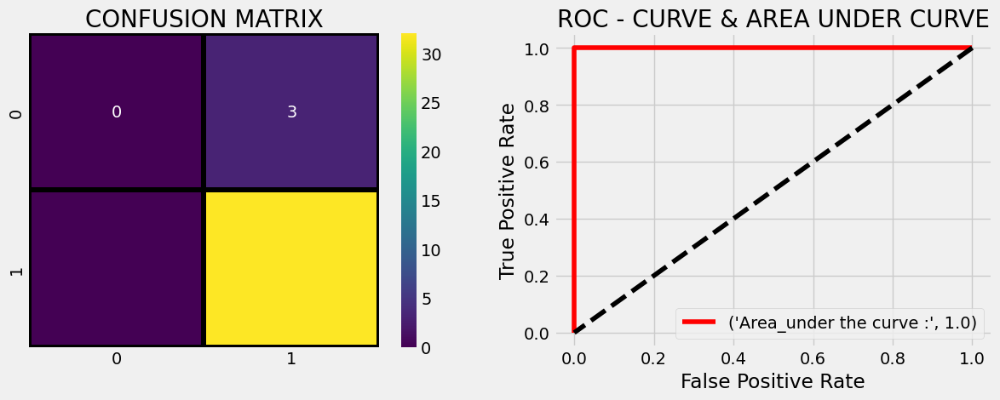

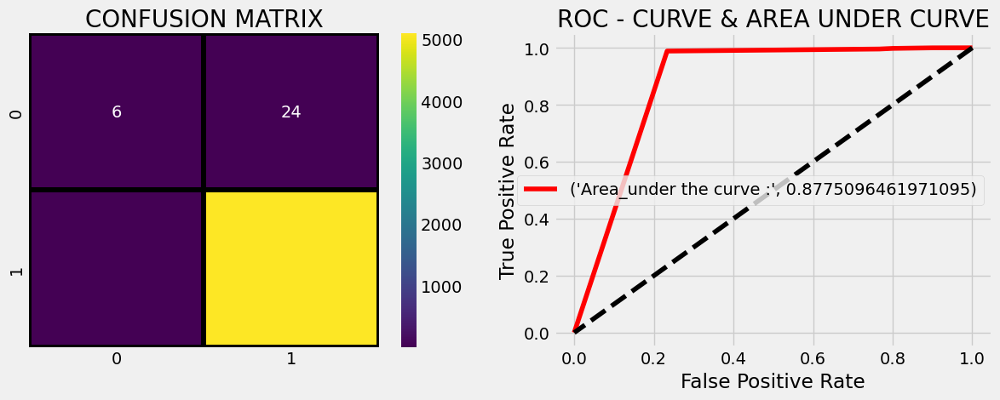

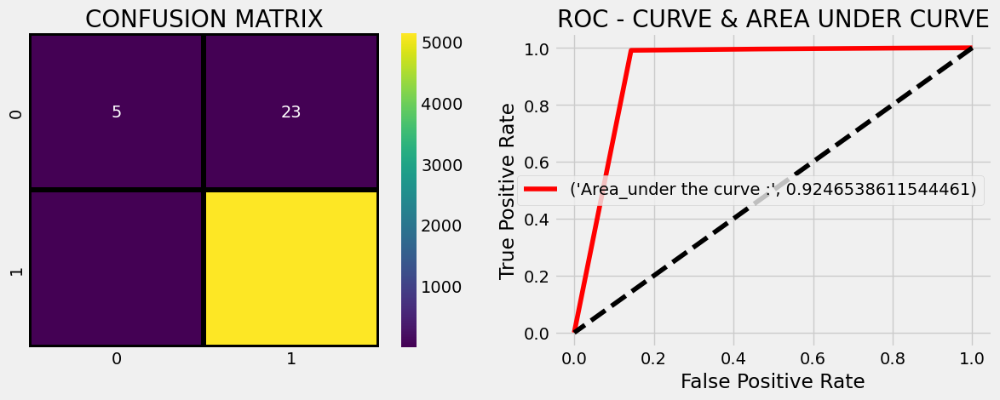

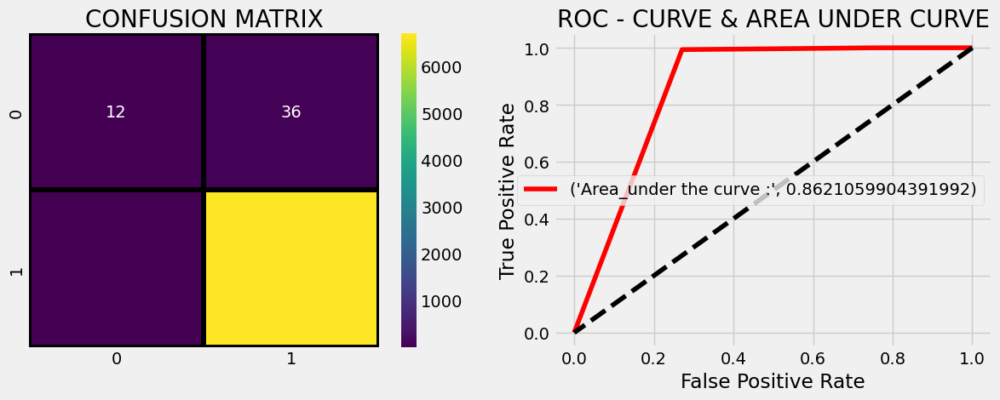

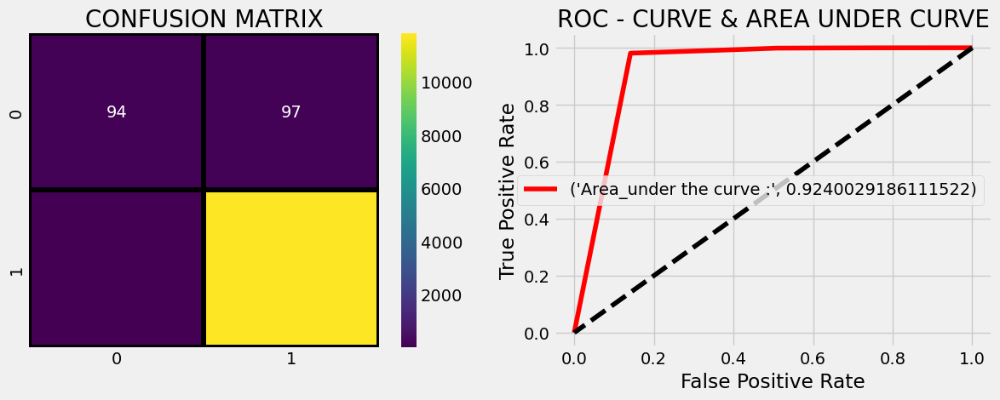

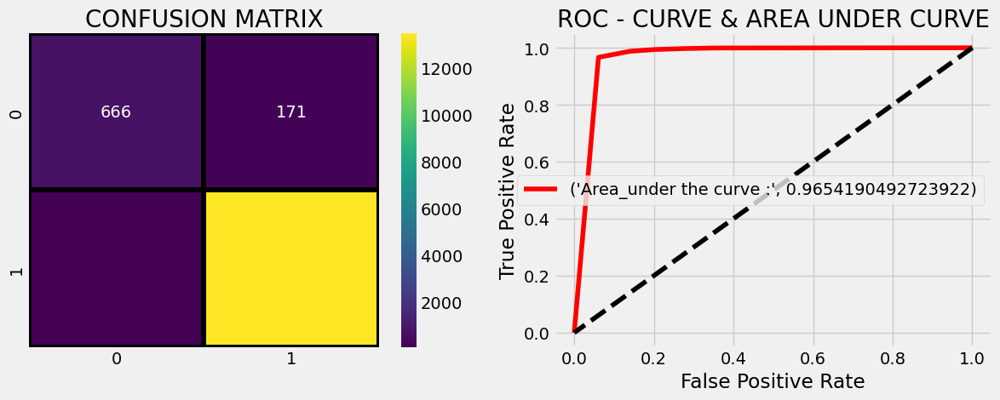

In [34]:
cut_offs = [30000, 25000, 20000, 15000, 10000, 5000]

# fig, axs = plt.subplots(6, 1, figsize=(2,12))
# axs = axs.ravel()



for cutoff in cut_offs:
    exo_df_filt = exo_df[na_counts[na_counts < cutoff].index]
    exo_df_filt = exo_df_filt.dropna()

    exo_df_filt['method'] = exo_df_filt.apply(add_method, axis=1)
    exo_df_filt['method_str'] = exo_df_filt.apply(add_discovery, axis=1)
    
    y = exo_df_filt['method']
    X = exo_df_filt.drop(['discoverymethod', 'method', 'method_str'], axis='columns')

    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=3)
    
    knn_model.fit(x_train, y_train)
    prediction=knn_model.predict(x_test)

    print("Cutoff:\t{}\n".format(cutoff))
    print(exo_df_filt['method_str'].value_counts(), '\n')
    
    print('Validation accuracy of KNN is', accuracy_score(prediction,y_test))
    print ("\nClassification report :\n",(classification_report(y_test,prediction)))
    
    #Confusion matrix
    plt.figure(figsize=(13,10))
    plt.subplot(221)
    sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
    plt.title("CONFUSION MATRIX",fontsize=20)
    
    #ROC curve and Area under the curve plotting
    predicting_probabilites = knn_model.predict_proba(x_test)[:,1]
    fpr,tpr,thresholds = roc_curve(y_test.to_numpy(),predicting_probabilites)
    plt.subplot(222)
    plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
    plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
    plt.legend(loc = "best")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

    print('\n\n\n')

What if we use SMOTE?

Cutoff:	30000

method_str
non-Transit    70
Name: count, dtype: int64 

Validation accuracy of KNN is 0.984375

Classification report :
               precision    recall  f1-score   support

           0       0.97      1.00      0.99        36
           1       1.00      0.96      0.98        28

    accuracy                           0.98        64
   macro avg       0.99      0.98      0.98        64
weighted avg       0.98      0.98      0.98        64





Cutoff:	25000

method_str
non-Transit    8589
Transit        1664
Name: count, dtype: int64 

Validation accuracy of KNN is 0.9877438964604373

Classification report :
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      5076
           1       1.00      0.98      0.99      5123

    accuracy                           0.99     10199
   macro avg       0.99      0.99      0.99     10199
weighted avg       0.99      0.99      0.99     10199





Cutoff:	20000

method_str
non-Tr

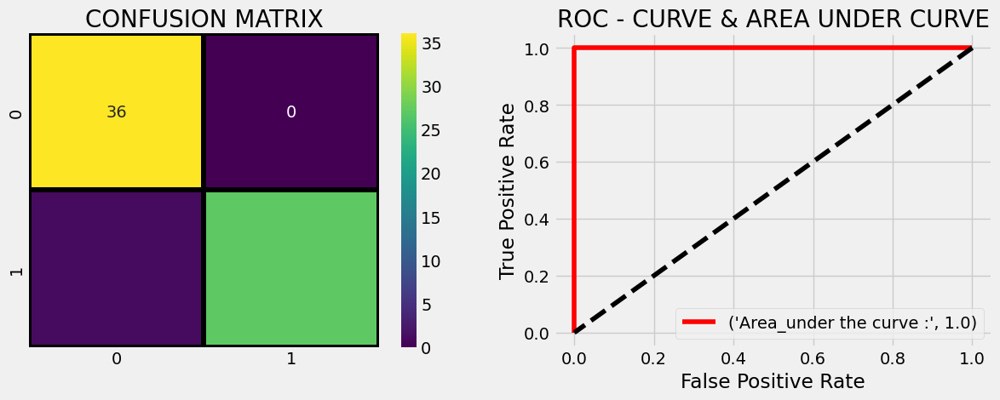

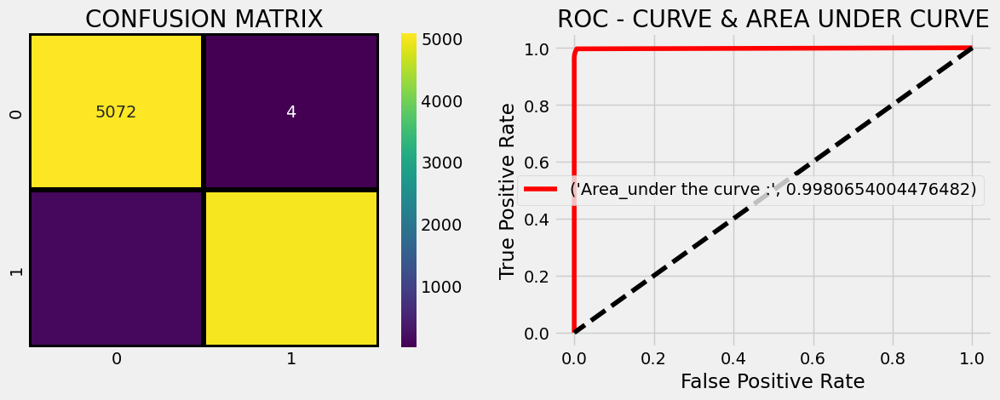

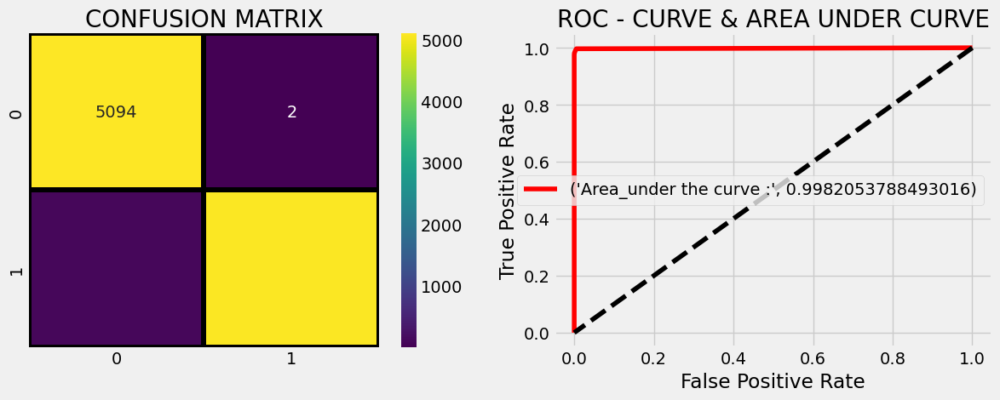

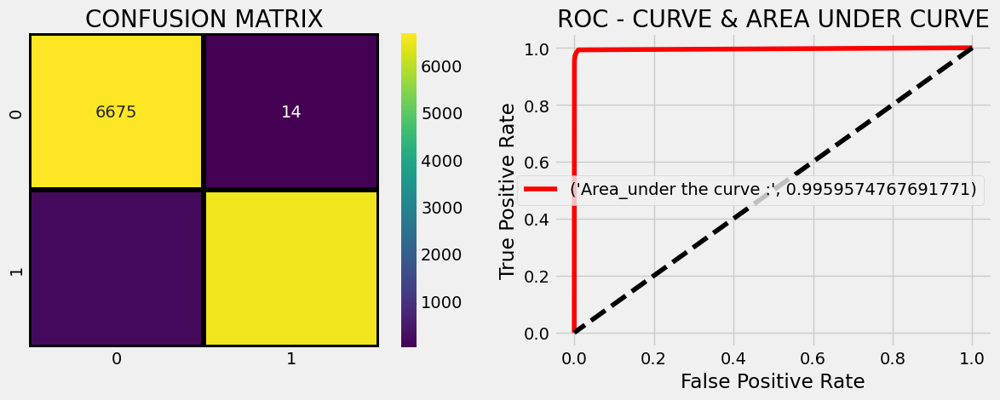

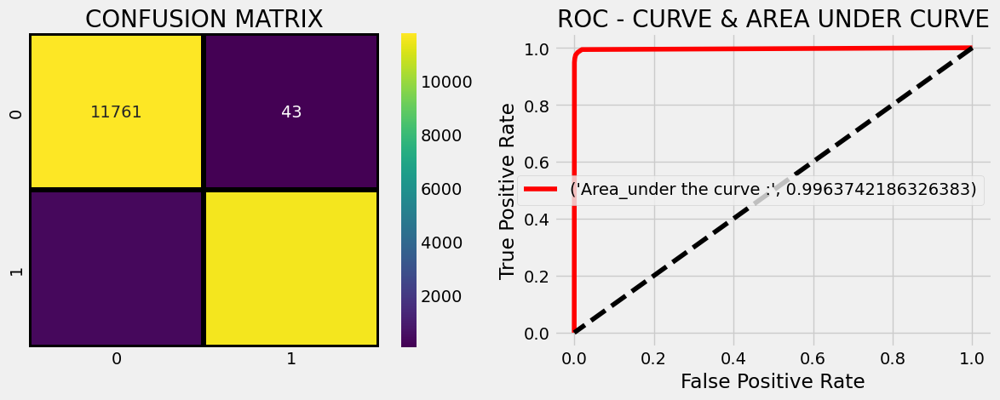

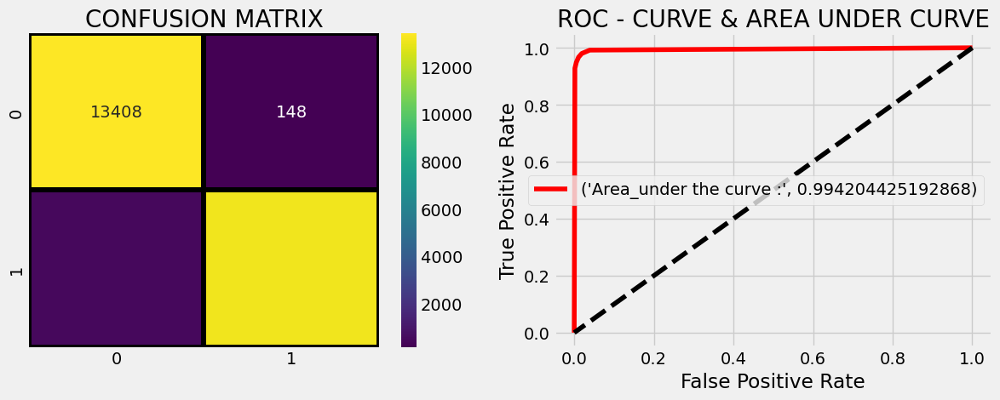

In [35]:
cut_offs = [30000, 25000, 20000, 15000, 10000, 5000]

# fig, axs = plt.subplots(6, 1, figsize=(2,12))
# axs = axs.ravel()

model_SMOTE = SMOTE()
model_random = RandomOverSampler(random_state=42)

for cutoff in cut_offs:
    exo_df_filt = exo_df[na_counts[na_counts < cutoff].index]
    exo_df_filt = exo_df_filt.dropna()

    exo_df_filt['method'] = exo_df_filt.apply(add_method, axis=1)
    exo_df_filt['method_str'] = exo_df_filt.apply(add_discovery, axis=1)
    
    y = exo_df_filt['method']
    X = exo_df_filt.drop(['discoverymethod', 'method', 'method_str'], axis='columns')

    try:
        ov_train_x, ov_train_y = model_SMOTE.fit_resample(X, y)
    except:
        ov_train_x, ov_train_y = model_random.fit_resample(X, y)

    x_train, x_test, y_train, y_test = train_test_split(ov_train_x, ov_train_y, test_size=0.5, random_state=3)
    
    knn_model.fit(x_train, y_train)

    exo_df_filt['method'] = ov_train_y
    exo_df_filt['method_str'] = exo_df_filt.apply(add_discovery, axis=1)
    
    prediction=knn_model.predict(x_test)

    print("Cutoff:\t{}\n".format(cutoff))
    print(exo_df_filt['method_str'].value_counts(), '\n')
    
    print('Validation accuracy of KNN is', accuracy_score(prediction,y_test))
    print ("\nClassification report :\n",(classification_report(y_test,prediction)))
    
    #Confusion matrix
    plt.figure(figsize=(13,10))
    plt.subplot(221)
    sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
    plt.title("CONFUSION MATRIX",fontsize=20)
    
    #ROC curve and Area under the curve plotting
    predicting_probabilites = knn_model.predict_proba(x_test)[:,1]
    fpr,tpr,thresholds = roc_curve(y_test.to_numpy(),predicting_probabilites)
    plt.subplot(222)
    plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
    plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
    plt.legend(loc = "best")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

    print('\n\n\n')

In [37]:
exo_df_filt.to_pickle('ov_exo_df')